<a href="https://colab.research.google.com/github/kasparvonbeelen/UIBK-DH-LLM-Workshop/blob/dev/UIBK_DH_Workshop_Introduction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Overview

Reflect on Language Models within the context of DH research

- Intro: A very quick, hands-on introduction to language modelling and language model
- Applications:
  - Interrogating Language Models: experiments with historical and queer language models
  - Using LLMs for annotating and structuring newspaper data
  - A very simply RAG pipeline for chatting with the past
  - Multimodal models: asking questions to images

# Language Models as Models of Language

## What are language models?

LMs tell us what is likely to come next in a sequence. More technically:

> “[Language models] assign a probability* to each possible next word. (Jurafsky & Martin)”
- Given a vocabulary *V*, which *w* (word) in *V* is likely to follow a sequence *s*?

Given the sentence **“Predicting the future is hard, but not …”**

- P(“impossible” | sentence) is greater than P(“aardvark” | sentence)


> Read P(“impossible” | sentence) as the probability of observing the token “impossible” given the sequence “Predicting the future is hard, but not ...


> Probabilities are values between 0 and 1 that sum up to 1.

## How are Language models created?

- Language modelling: improve the model so that it does better at predicting the next word given an input sequence
- Instruction tuning: improve the model so that it can follow instructions

E.g. [Llama-3-8B](https://huggingface.co/meta-llama/Meta-Llama-3-8B) vs. [Llama-3-8B-Instruct](https://huggingface.co/meta-llama/Meta-Llama-3-8B-Instruct)

# One token at a time
## Next word prediction with GPT-2

Next word prediction is the building block of generative AI. We will also encounter it when playing with larger language models such as ChatGPT.

In the following example, we generate just one toke to show a language model creates a probability distribution over possible next words.

In [3]:
%%bash
pip install -q transformers accelerate datasets shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.5/540.5 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 MB 16.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 14.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 53.0 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 24.4.1 requires pyarrow<15.0.0a0,>=14.0.1, but you have pyarrow 16.1.0 which is incompatible.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.
ibis-framework 8.0.0 requires pyarrow<16,>=2, but you have pyarrow 16.1.0 which is incompatible.


In [4]:
from transformers import GPT2LMHeadModel, GPT2Tokenizer, GPT2Model, pipeline
import numpy as np
import shap
from torch.nn import Softmax
import pandas as pd
# initialize softmax function
softmax = Softmax(dim=0)

In [5]:
#prompt = 'Hello my name is John' # define a prompt
prompt = 'Predicting the future is hard, but not'

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.04M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/665 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/548M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

<Axes: >

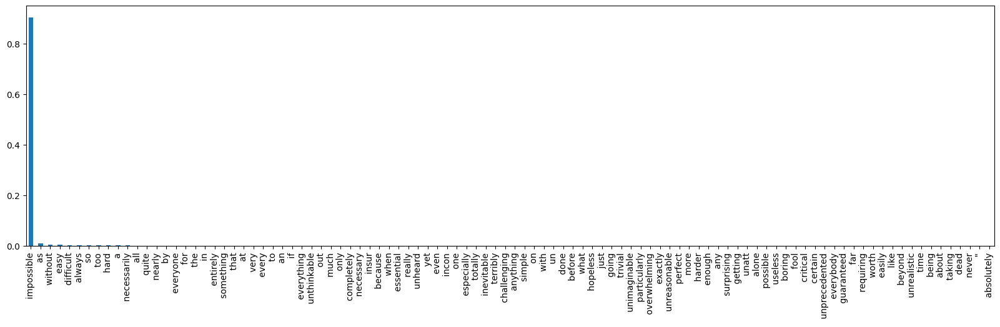

In [6]:
# tokenizer will split a text in units the LM is built on
tokenizer = GPT2Tokenizer.from_pretrained("gpt2")
# add the EOS token as PAD token to avoid warnings
model = GPT2LMHeadModel.from_pretrained("gpt2", pad_token_id=tokenizer.eos_token_id)
# load the gpt-2 model
gpt2 = GPT2Model.from_pretrained("gpt2", pad_token_id=tokenizer.eos_token_id)
# get logits from model
predictions = model(**tokenizer(prompt, return_tensors='pt'))
# the predictions as logits
# predictions.logits.shape
# get words with highest probability
tokenizer.decode(np.argmax(predictions.logits[0,-1,:].detach().numpy()))
# order predictions
series = pd.Series(softmax(predictions.logits[0,-1,:]).detach()).sort_values(ascending=False)
# change token_ids to the actual tokens
index = [tokenizer.decode(x) for x in series.index]
# set tokens as index
series.index = index
# plot results
series[:100].plot(kind='bar',figsize=(20,5))

## From predicting the next token to generating texts

In [8]:
tokenizer_gpt2 = GPT2Tokenizer.from_pretrained("gpt2")
generator_gpt2 = pipeline('text-generation', # define the task
                     model = 'gpt2', # define the model
                     pad_token_id=tokenizer.eos_token_id)


In [9]:
completions = generator_gpt2(prompt,
            max_length = 30,  # max length of each generated text
            num_return_sequences=3 # how many texts to generate
         )
completions

Truncation was not explicitly activated but `max_length` is provided a specific value, please use `truncation=True` to explicitly truncate examples to max length. Defaulting to 'longest_first' truncation strategy. If you encode pairs of sequences (GLUE-style) with the tokenizer you can select this strategy more precisely by providing a specific strategy to `truncation`.


[{'generated_text': "Predicting the future is hard, but not impossible.\n\nMost of you will be aware that I've written a number of interesting posts over"},
 {'generated_text': 'Predicting the future is hard, but not impossible. And in any event, it would be better to be able to predict when it will happen'},
 {'generated_text': "Predicting the future is hard, but not impossible. We don't believe in any kind of predictions. It's up to each individual individual to"}]

## Models ❤️ Data

- models "mimick" or "parrot" the data they are trained on (often referred to as "corpus models" instead of "language models"
- [stochastic parrots](https://dl.acm.org/doi/10.1145/3442188.3445922): randomness and lack of understanding
- **different training data, different model outputs (repeat)**
- models as "compression of data"


In [10]:
from transformers import AutoTokenizer, AutoModelForCausalLM,pipeline
import shap

In [12]:
explainer_dict = {}

for checkpoint in  ['gpt2','Kaspar/QueerGPT2','Kaspar/gpt-brexit']:
  tokenizer = AutoTokenizer.from_pretrained('gpt2', use_fast=True)
  model = AutoModelForCausalLM.from_pretrained(checkpoint)
  wrapped_model = shap.models.TopKLM(model, tokenizer, k=25)
  masker = shap.maskers.Text(tokenizer, mask_token="...", collapse_mask_token=True)
  explainer = shap.Explainer(wrapped_model, masker)
  explainer_dict[checkpoint] = explainer

pytorch_model.bin:   0%|          | 0.00/510M [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/119 [00:00<?, ?B/s]

In [13]:
prompt = "First I went to walk the dog, then I had breakfast, now I will go to the" # change the prompt
expl = 'gpt2'
shap_values = explainer_dict[expl]([prompt])
shap.plots.text(shap_values)

  0%|          | 0/342 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:49, 49.25s/it]               


In [27]:
prompt = "I want the United Kingdom to stay in the European Union. I will vote for" # change the prompt
expl = 'gpt2' # gpt2 | Kaspar/gpt-brexit
shap_values = explainer_dict[expl]([prompt])
shap.plots.text(shap_values)

  0%|          | 0/240 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:36, 36.70s/it]               


In [24]:
# tokens predicted by QueerGPT
prompt = "When I grow up, I want to become a" # change the prompt
expl = 'Kaspar/QueerGPT2' # 'Kaspar/QueerGPT2' | gpt2
shap_values = explainer_dict[expl]([prompt])
shap.plots.text(shap_values)

  0%|          | 0/90 [00:00<?, ?it/s]

In [34]:
prompt = "I want the United Kingdom to stay in the European Union. Therefore, I will vote for" # change the prompt
checkpoint = 'Kaspar/gpt-brexit' #  choose gpt2 or Kaspar/QueerGPT2
tokenizer = AutoTokenizer.from_pretrained('gpt2', use_fast=True)
model = AutoModelForCausalLM.from_pretrained(checkpoint)
# set model decoder to true
model.config.is_decoder = True
# set text-generation params under task_specific_params
model.config.task_specific_params["text-generation"] = {
    "do_sample": True,
    "max_length": 200,
    "temperature": 0.1,
    "top_k": 50,
    #"no_repeat_ngram_size": 2,
}
explainer = shap.Explainer(model, tokenizer)
shap_values = explainer([prompt])

Setting `pad_token_id` to `eos_token_id`:50256 for open-end generation.


  0%|          | 0/306 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:42, 42.38s/it]               


In [35]:
shap.plots.text(shap_values)

## Historical Language Models

BERT models fine-tuned on 19th century book collection as described in [our paper](https://openhumanitiesdata.metajnl.com/articles/10.5334/johd.48).

In [36]:
from transformers import pipeline
sentence = "Our sewing [MASK] stood near the wall where grated windows admitted sunshine, and their hymn to Labour was the only sound that broke the brooding silence."

masker = pipeline("fill-mask", model='bert-base-uncased')
masker(sentence)

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

[{'score': 0.5995791554450989,
  'token': 6681,
  'token_str': 'machines',
  'sequence': 'our sewing machines stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.11765220016241074,
  'token': 3698,
  'token_str': 'machine',
  'sequence': 'our sewing machine stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.029535066336393356,
  'token': 2282,
  'token_str': 'room',
  'sequence': 'our sewing room stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.017924878746271133,
  'token': 4734,
  'token_str': 'rooms',
  'sequence': 'our sewing rooms stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 

In [37]:
from transformers import pipeline

victorian_masker = pipeline("fill-mask", model='Livingwithmachines/bert_1760_1850')
victorian_masker(sentence)

config.json:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/440M [00:00<?, ?B/s]

Some weights of the model checkpoint at Livingwithmachines/bert_1760_1850 were not used when initializing BertForMaskedLM: ['bert.pooler.dense.bias', 'bert.pooler.dense.weight']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/39.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

[{'score': 0.44799569249153137,
  'token': 3057,
  'token_str': 'girls',
  'sequence': 'our sewing girls stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.1363261342048645,
  'token': 2308,
  'token_str': 'women',
  'sequence': 'our sewing women stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.03960535302758217,
  'token': 5208,
  'token_str': 'sisters',
  'sequence': 'our sewing sisters stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 0.03331465274095535,
  'token': 2336,
  'token_str': 'children',
  'sequence': 'our sewing children stood near the wall where grated windows admitted sunshine, and their hymn to labour was the only sound that broke the brooding silence.'},
 {'score': 